## Data Preprocessing

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
data =pd.read_csv("Data_Cortex_Nuclear.csv")
data.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   DYRK1A_N         1077 non-null   float64
 2   ITSN1_N          1077 non-null   float64
 3   BDNF_N           1077 non-null   float64
 4   NR1_N            1077 non-null   float64
 5   NR2A_N           1077 non-null   float64
 6   pAKT_N           1077 non-null   float64
 7   pBRAF_N          1077 non-null   float64
 8   pCAMKII_N        1077 non-null   float64
 9   pCREB_N          1077 non-null   float64
 10  pELK_N           1077 non-null   float64
 11  pERK_N           1077 non-null   float64
 12  pJNK_N           1077 non-null   float64
 13  PKCA_N           1077 non-null   float64
 14  pMEK_N           1077 non-null   float64
 15  pNR1_N           1077 non-null   float64
 16  pNR2A_N          1077 non-null   float64
 17  pNR2B_N       

In [3]:
data.describe(include='all')

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
count,1080,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000,1080,1080,1080,1080
unique,1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2,2,2,8
top,309_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Control,Memantine,S/C,c-CS-m
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,570,570,555,150
mean,NaN,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,...,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784,NaN,NaN,NaN,NaN
std,NaN,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,...,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126,NaN,NaN,NaN,NaN
min,NaN,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,...,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479,NaN,NaN,NaN,NaN
25%,NaN,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,...,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423,NaN,NaN,NaN,NaN
50%,NaN,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,...,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441,NaN,NaN,NaN,NaN
75%,NaN,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,...,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824,NaN,NaN,NaN,NaN


In [4]:
data.isnull().sum()

MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64

**Identifying Missing Values**

In [5]:
missing_values=data.isnull().sum()
missing_values[missing_values>0]

# Droping columns with more than 20% missing values
threshold = 0.1 * len(data)
data = data.dropna(thresh=threshold, axis=1)

**Imputing missing values using median strategy**

In [6]:
numeric_columns = data.select_dtypes(include=[np.number]).columns
imputer = SimpleImputer(strategy='median')
data[numeric_columns] = imputer.fit_transform(data[numeric_columns])
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   DYRK1A_N         1080 non-null   float64
 2   ITSN1_N          1080 non-null   float64
 3   BDNF_N           1080 non-null   float64
 4   NR1_N            1080 non-null   float64
 5   NR2A_N           1080 non-null   float64
 6   pAKT_N           1080 non-null   float64
 7   pBRAF_N          1080 non-null   float64
 8   pCAMKII_N        1080 non-null   float64
 9   pCREB_N          1080 non-null   float64
 10  pELK_N           1080 non-null   float64
 11  pERK_N           1080 non-null   float64
 12  pJNK_N           1080 non-null   float64
 13  PKCA_N           1080 non-null   float64
 14  pMEK_N           1080 non-null   float64
 15  pNR1_N           1080 non-null   float64
 16  pNR2A_N          1080 non-null   float64
 17  pNR2B_N       

**Normalization/Standardization**

In [7]:
numeric_columns = data.select_dtypes(include=[np.number]).columns
scaler = StandardScaler()
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

**Encoding Categorical Variables**

In [8]:
scaler = StandardScaler()
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])
cols=[ 'Genotype', 'Treatment', 'Behavior', 'class']
le=LabelEncoder()

for i in cols:
    data[i]=le.fit_transform(data[i])

print(data.head())
print(data.info())

data.to_csv('clean_data.csv', index=False)

  MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
0   309_1  0.313350  0.518471  2.253803  1.497368  2.304588 -0.344885   
1   309_2  0.357433  0.287052  1.880415  1.420015  1.976995 -0.517992   
2   309_3  0.335603  0.451006  2.013063  1.124866  1.909375 -0.581163   
3   309_4  0.066132  0.000465  0.802262  0.489487  1.219480 -0.247290   
4   309_5  0.037342  0.001873  0.805831  0.197657  0.939439 -0.482624   

    pBRAF_N  pCAMKII_N   pCREB_N  ...   pCFOS_N     SYP_N  H3AcK18_N  \
0 -0.158648  -0.899416  0.604281  ... -0.972480 -0.285744  -0.973682   
1 -0.334569  -0.962530  0.442825  ... -1.147005 -0.067645  -1.025367   
2 -0.226938  -0.969347  0.543502  ... -1.064360 -0.155059  -1.027034   
3 -0.199508  -1.070704 -0.171066  ... -0.845461 -0.818989  -0.686310   
4 -0.304563  -1.084849 -0.627499  ... -0.870119 -0.179502  -0.905652   

     EGR1_N  H3MeK4_N    CaNA_N  Genotype  Treatment  Behavior  class  
0 -1.367167 -1.540161  1.065901         0          0    

## EDA

In [9]:
data=pd.read_csv('clean_data.csv')

In [10]:
print(data.describe())

           DYRK1A_N       ITSN1_N        BDNF_N         NR1_N        NR2A_N  \
count  1.080000e+03  1.080000e+03  1.080000e+03  1.080000e+03  1.080000e+03   
mean   3.618505e-17 -1.973730e-17  2.631640e-17 -3.947460e-17  2.631640e-17   
std    1.000463e+00  1.000463e+00  1.000463e+00  1.000463e+00  1.000463e+00   
min   -1.126142e+00 -1.479373e+00 -4.136593e+00 -2.787938e+00 -2.261334e+00   
25%   -5.523169e-01 -5.704517e-01 -6.376500e-01 -6.869042e-01 -7.337668e-01   
50%   -2.380992e-01 -2.037422e-01 -5.106595e-02 -2.080444e-03 -8.895159e-02   
75%    2.487902e-01  3.206399e-01  5.874721e-01  6.657095e-01  6.242383e-01   
max    8.399194e+00  7.905241e+00  3.612743e+00  4.212830e+00  4.980616e+00   

             pAKT_N       pBRAF_N     pCAMKII_N      pCREB_N        pELK_N  \
count  1.080000e+03  1.080000e+03  1.080000e+03  1080.000000  1.080000e+03   
mean   1.315820e-17  1.644775e-17  2.631640e-17     0.000000  4.605370e-17   
std    1.000463e+00  1.000463e+00  1.000463e+00     1.

In [11]:
print(data.describe(include=['object']))

       MouseID
count     1080
unique    1080
top      309_1
freq         1


In [12]:
print(data.isnull().sum())

MouseID      0
DYRK1A_N     0
ITSN1_N      0
BDNF_N       0
NR1_N        0
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64


**Verification of any missing values**

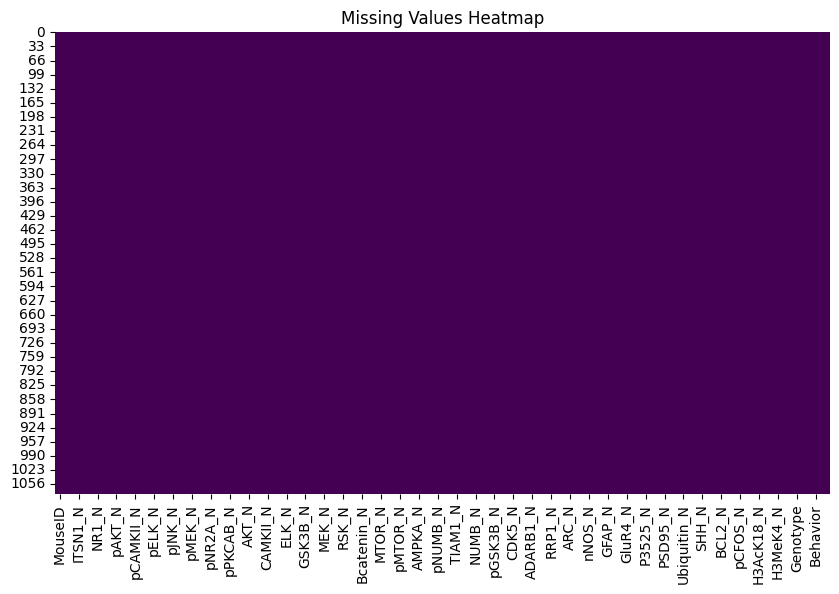

In [13]:
plt.figure(figsize=(10, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

**Plotting histograms for each proteins**

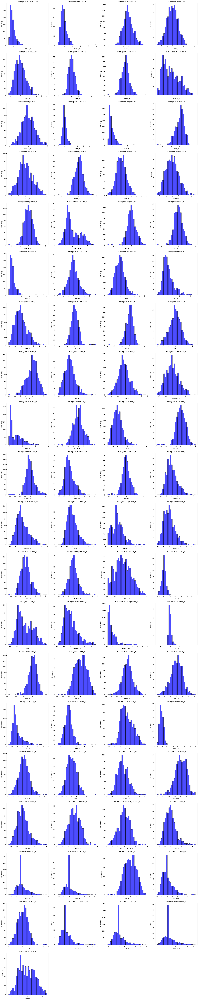

In [14]:
proteins = data.columns[1:-4]  
plt.figure(figsize=(20, 100))
for i, protein in enumerate(proteins, 1):
    plt.subplot(len(proteins) // 4 + 1, 4, i)
    plt.hist(data[protein], bins=30, alpha=0.7, color='b', edgecolor='black')
    plt.title(f'Histogram of {protein}')
    plt.xlabel(protein)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

**Plotting Box plot for outliers**

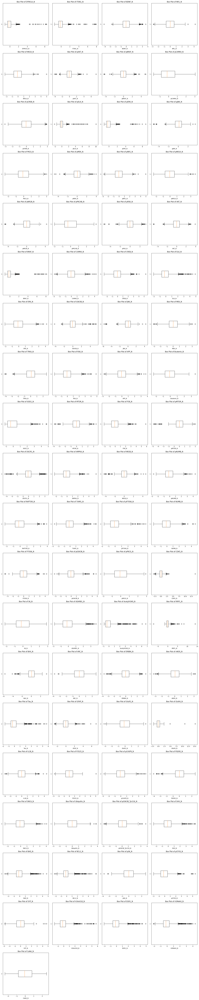

In [15]:
plt.figure(figsize=(20, 100))
for i, protein in enumerate(proteins, 1):
    plt.subplot(len(proteins) // 4 + 1, 4, i)
    plt.boxplot(data[protein], vert=False)
    plt.title(f'Box Plot of {protein}')
    plt.xlabel(protein)
plt.tight_layout()
plt.show()

**Plotting all Box plot for outliers in one graph**

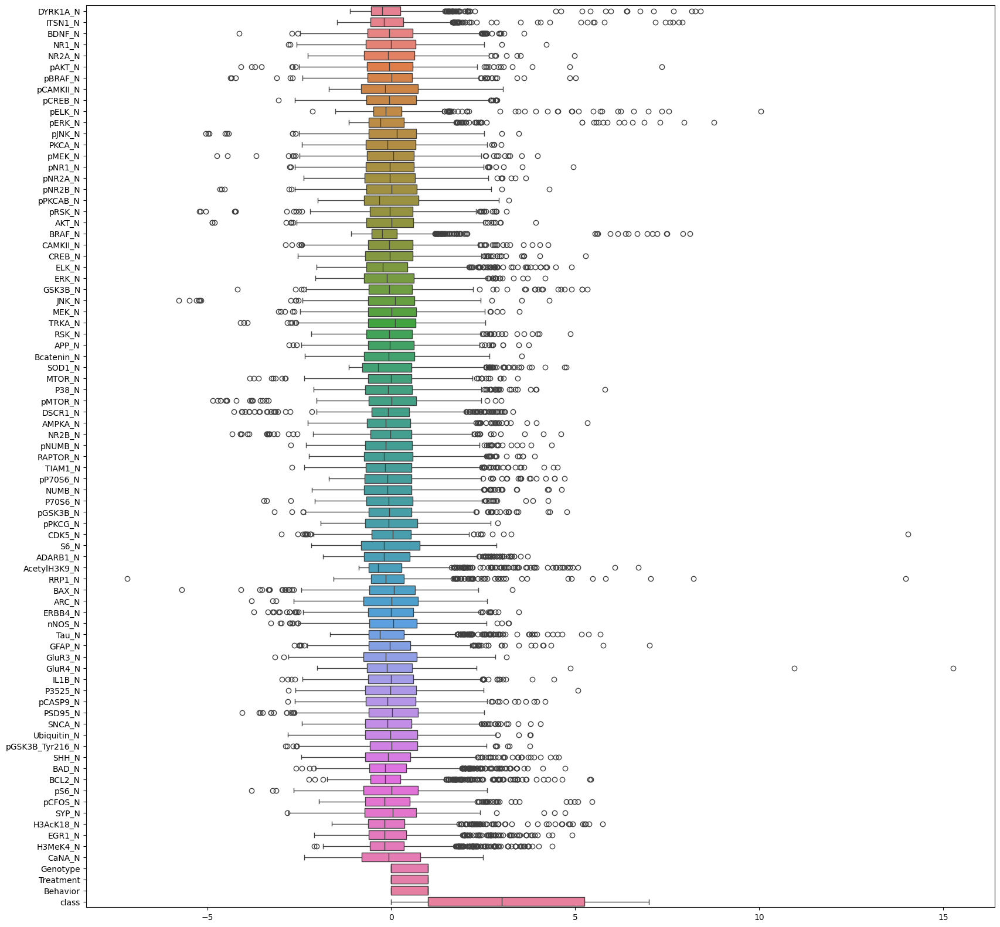

In [16]:
plt.figure(figsize=(20, 20))
sns.boxplot(data=data, orient="h")
plt.show()

**Correlation matrix**

In [17]:
correlation_matrix = data[proteins].corr()
print(correlation_matrix)

           DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
DYRK1A_N   1.000000  0.959516  0.359437  0.294504  0.325093 -0.180912   
ITSN1_N    0.959516  1.000000  0.459884  0.422469  0.426203 -0.147739   
BDNF_N     0.359437  0.459884  1.000000  0.805781  0.749995  0.317542   
NR1_N      0.294504  0.422469  0.805781  1.000000  0.873879  0.211540   
NR2A_N     0.325093  0.426203  0.749995  0.873879  1.000000  0.110183   
...             ...       ...       ...       ...       ...       ...   
SYP_N     -0.046956  0.042642  0.450371  0.473243  0.400518  0.248519   
H3AcK18_N -0.239092 -0.233313 -0.121406 -0.207870 -0.285808  0.308040   
EGR1_N    -0.305799 -0.370751 -0.221678 -0.279878 -0.310509  0.241871   
H3MeK4_N  -0.281432 -0.329997 -0.221464 -0.305584 -0.385562  0.288079   
CaNA_N     0.475635  0.517419  0.262465  0.205416  0.187153 -0.238566   

            pBRAF_N  pCAMKII_N   pCREB_N    pELK_N  ...     SHH_N     BAD_N  \
DYRK1A_N  -0.093740  -0.180041  0.047335  0.

**Heatmap for correlation matrix**

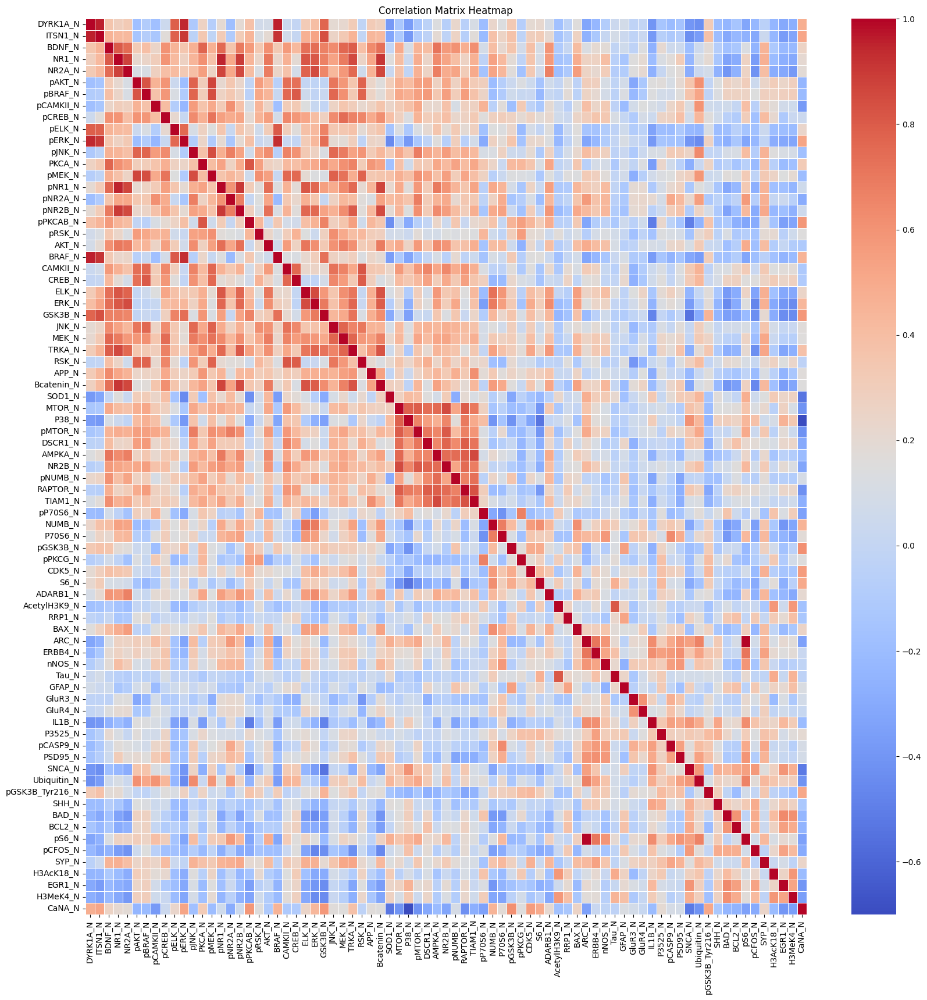

In [18]:
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

**Scatter plot for outliers**

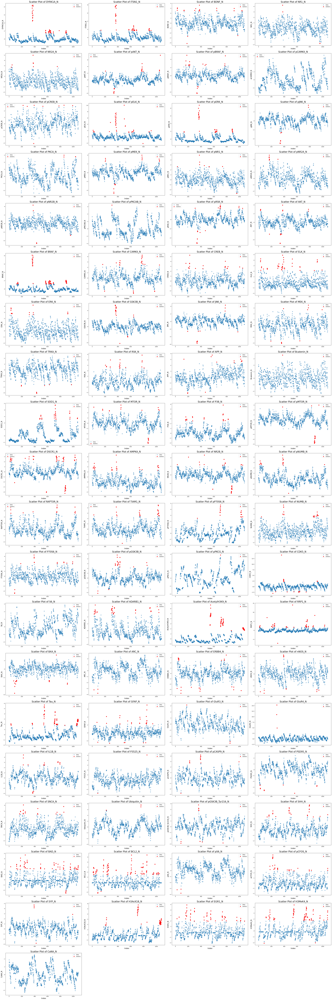

In [19]:
#Calculating IQR(InterQuartile Range) for finding outliers & ploting it using scatter plots
plt.figure(figsize=(40, 120))
for i, protein in enumerate(proteins, 1):
    Q1 = data[protein].quantile(0.25)
    Q3 = data[protein].quantile(0.75)
    IQR = Q3 - Q1
    outliers = data[(data[protein] < (Q1 - 1.5 * IQR)) | (data[protein] > (Q3 + 1.5 * IQR))]
    plt.subplot(len(proteins) // 4 + 1, 4, i)
    plt.scatter(data.index, data[protein], alpha=0.5, label='Data')
    plt.scatter(outliers.index, outliers[protein], color='r', label='Outliers')
    plt.title(f'Scatter Plot of {protein}', fontsize=20)
    plt.xlabel('Index', fontsize=15)
    plt.ylabel(protein, fontsize=15)
    plt.legend()
plt.tight_layout()
plt.show()

**Count plots for categorical variables**

C:\Users\SUKHMAN DEEP SINGH\AppData\Local\Temp\ipykernel_8996\4277923806.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[column], palette='viridis',legend =False)
C:\Users\SUKHMAN DEEP SINGH\AppData\Local\Temp\ipykernel_8996\4277923806.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[column], palette='viridis',legend =False)
C:\Users\SUKHMAN DEEP SINGH\AppData\Local\Temp\ipykernel_8996\4277923806.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=data[column], palette='viridis',legend =False)
C:\Users\SUKHMAN DE

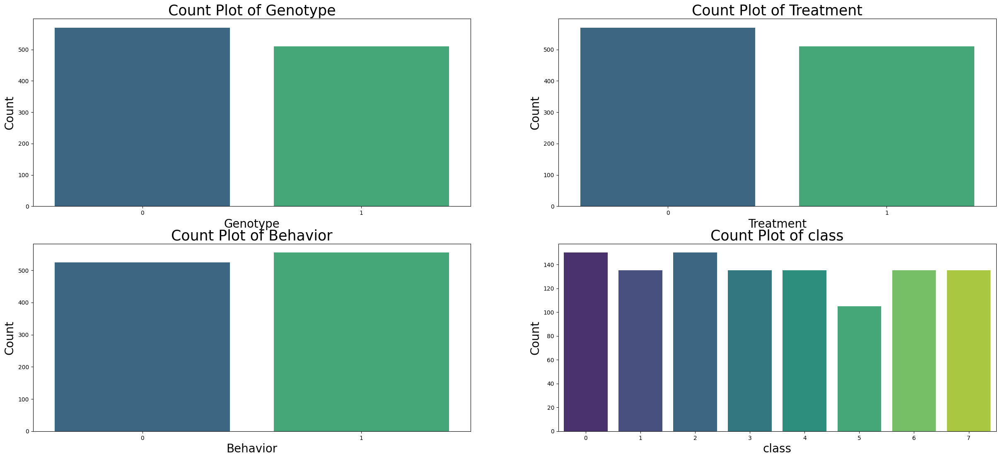

In [20]:
categorical_columns = ['Genotype', 'Treatment', 'Behavior', 'class']
plt.figure(figsize=(30, 20))
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(len(categorical_columns) // 2 + 1, 2, i)
    sns.countplot(x=data[column], palette='viridis')
    plt.title(f'Count Plot of {column}', fontsize = 25)
    plt.xlabel(column, fontsize = 20)
    plt.ylabel('Count',fontsize = 20)
plt.tight_layout
plt.show()

# Feature selection

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.feature_selection import mutual_info_classif, SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [22]:
numerical_columns = data.select_dtypes(include=[np.number]).columns.tolist()
numerical_columns = [col for col in numerical_columns if col not in ['class']] 
# Separate features and target variable
X = data[numerical_columns]
y = data['class']  # Taking 'class' as a target variable
# Standardize the numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=numerical_columns)

**Correlation Analysis**

In [23]:
correlation_matrix = X_scaled.corr()
high_corr_pairs = correlation_matrix.abs().unstack().sort_values(kind="quicksort", ascending=False)
high_corr_pairs = high_corr_pairs[(high_corr_pairs > 0.8) & (high_corr_pairs < 1.0)]
print("Highly correlated features:")
print(high_corr_pairs)

Highly correlated features:
BRAF_N    DYRK1A_N    0.959584
DYRK1A_N  BRAF_N      0.959584
ITSN1_N   DYRK1A_N    0.959516
DYRK1A_N  ITSN1_N     0.959516
NR1_N     pNR1_N      0.947870
                        ...   
BRAF_N    pELK_N      0.804101
TRKA_N    pNR2B_N     0.800900
pNR2B_N   TRKA_N      0.800900
TRKA_N    BDNF_N      0.800227
BDNF_N    TRKA_N      0.800227
Length: 82, dtype: float64


**Mutual Information**

In [24]:
mi_scores = mutual_info_classif(X_scaled, y, discrete_features='auto')
mi_scores_df = pd.DataFrame({'Feature': numerical_columns, 'Mutual Information': mi_scores})
mi_scores_df = mi_scores_df.sort_values(by='Mutual Information', ascending=False)
print("Mutual Information Scores:")
print(mi_scores_df)

Mutual Information Scores:
       Feature  Mutual Information
32      SOD1_N            0.812514
77    Genotype            0.707704
46     pPKCG_N            0.706373
10      pERK_N            0.686508
79    Behavior            0.682546
..         ...                 ...
52       BAX_N            0.089355
27       MEK_N            0.086905
22      CREB_N            0.085565
31  Bcatenin_N            0.084500
28      TRKA_N            0.071384

[80 rows x 2 columns]


**Feature Importance from Random Forest**

In [25]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_scaled, y)
rf_importances = rf_model.feature_importances_
rf_importance_df = pd.DataFrame({'Feature': numerical_columns, 'Importance': rf_importances})
rf_importance_df = rf_importance_df.sort_values(by='Importance', ascending=False)
print("Random Forest Feature Importances:")
print(rf_importance_df)

Random Forest Feature Importances:
       Feature  Importance
78   Treatment    0.114818
77    Genotype    0.104747
32      SOD1_N    0.048776
79    Behavior    0.044527
46     pPKCG_N    0.038075
..         ...         ...
59     GluR4_N    0.003122
27       MEK_N    0.003031
31  Bcatenin_N    0.002788
71     pCFOS_N    0.002540
74      EGR1_N    0.002315

[80 rows x 2 columns]


**Feature Importance from Gradient Boosting**

In [26]:
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_model.fit(X_scaled, y)
gb_importances = gb_model.feature_importances_
gb_importance_df = pd.DataFrame({'Feature': numerical_columns, 'Importance': gb_importances})
gb_importance_df = gb_importance_df.sort_values(by='Importance', ascending=False)
print("Gradient Boosting Feature Importances:")
print(gb_importance_df)

Gradient Boosting Feature Importances:
      Feature    Importance
77   Genotype  2.854744e-01
78  Treatment  2.372188e-01
32     SOD1_N  8.543307e-02
46    pPKCG_N  5.371204e-02
17   pPKCAB_N  4.289202e-02
..        ...           ...
36    DSCR1_N  4.278918e-08
22     CREB_N  1.445821e-09
2      BDNF_N  2.726610e-10
27      MEK_N  2.083195e-10
54    ERBB4_N  8.703682e-15

[80 rows x 2 columns]


**Feature Importance using Select KBest with F-Test**

In [27]:
best_features = SelectKBest(score_func=f_classif, k='all')
fit = best_features.fit(X_scaled, y)
feature_scores = pd.DataFrame({'Feature': numerical_columns, 'Score': fit.scores_})
feature_scores = (feature_scores.sort_values(by='Score', ascending=False))
print("F-Test Feature Scores:")
print(feature_scores)

F-Test Feature Scores:
      Feature         Score
77   Genotype           inf
78  Treatment           inf
79   Behavior  3.637059e+16
32     SOD1_N  2.908986e+02
76     CaNA_N  2.409718e+02
..        ...           ...
26      JNK_N  8.955450e+00
29      RSK_N  8.359389e+00
69     BCL2_N  5.433308e+00
51     RRP1_N  4.976166e+00
59    GluR4_N  3.247925e+00

[80 rows x 2 columns]


C:\Users\SUKHMAN DEEP SINGH\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


**Combining Results**

In [28]:
combined_importance = pd.merge(rf_importance_df, gb_importance_df, on='Feature', how='outer', suffixes=('_RF', '_GB'))
combined_importance['Avg_Importance'] = combined_importance[['Importance_RF', 'Importance_GB']].mean(axis=1)
combined_importance = (combined_importance.sort_values(by='Avg_Importance', ascending=False))
print("Combined Feature Importances:")
print(combined_importance)

Combined Feature Importances:
      Feature  Importance_RF  Importance_GB  Avg_Importance
1    Genotype       0.104747   2.854744e-01        0.195111
0   Treatment       0.114818   2.372188e-01        0.176018
2      SOD1_N       0.048776   8.543307e-02        0.067105
4     pPKCG_N       0.038075   5.371204e-02        0.045893
3    Behavior       0.044527   2.724006e-02        0.035883
..        ...            ...            ...             ...
75    GluR4_N       0.003122   3.455326e-04        0.001734
73    pBRAF_N       0.003400   7.086944e-06        0.001704
74      RSK_N       0.003150   9.660847e-07        0.001575
76      MEK_N       0.003031   2.083195e-10        0.001515
79     EGR1_N       0.002315   1.101748e-05        0.001163

[80 rows x 4 columns]


**Selecting common columns with the highest feature importances and F-Test scores**

In [29]:
fi_threshold = combined_importance['Avg_Importance'].median()
selected_fi_features = combined_importance[combined_importance['Avg_Importance'] >= fi_threshold]['Feature'].tolist()
fs_threshold = feature_scores['Score'].median()
selected_fs_features = feature_scores[feature_scores['Score'] >= fs_threshold]['Feature'].tolist()
common_selected_features = list(set(selected_fi_features) & set(selected_fs_features))
print("Selected Features based on combined importances and F-Test scores:")
print(common_selected_features)

Selected Features based on combined importances and F-Test scores:
['APP_N', 'MTOR_N', 'pP70S6_N', 'RAPTOR_N', 'ITSN1_N', 'Genotype', 'Behavior', 'pMTOR_N', 'DYRK1A_N', 'BRAF_N', 'CaNA_N', 'S6_N', 'Treatment', 'GSK3B_N', 'Tau_N', 'pS6_N', 'nNOS_N', 'Ubiquitin_N', 'P38_N', 'AKT_N', 'SNCA_N', 'pPKCG_N', 'H3AcK18_N', 'pNR2A_N', 'pERK_N', 'pGSK3B_N', 'SOD1_N', 'pCAMKII_N', 'pNUMB_N', 'pJNK_N', 'pPKCAB_N', 'ARC_N', 'IL1B_N']


In [30]:
len((common_selected_features))

33

# Model Training

In [31]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import mutual_info_classif, SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import xgboost as xgb

**Spliting the dataset into training and testing sets**

In [32]:
X_selected = X_scaled[common_selected_features]
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

**Model training using Random Forest Classifier**

In [33]:
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), param_grid=rf_param_grid, cv=5, n_jobs=-1, verbose=2)
rf_grid_search.fit(X_train, y_train)
best_rf = rf_grid_search.best_estimator_
rf_pred = best_rf.predict(X_test)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


**Model training using SVM**

In [34]:
svm_param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear']
}
svm_grid_search = GridSearchCV(estimator=SVC(random_state=42), param_grid=svm_param_grid, cv=5, n_jobs=-1, verbose=2)
svm_grid_search.fit(X_train, y_train)
best_svm = svm_grid_search.best_estimator_
svm_pred = best_svm.predict(X_test)


Fitting 5 folds for each of 32 candidates, totalling 160 fits


**Model training using XGBoost**

In [35]:
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0]
}
xgb_grid_search = GridSearchCV(estimator=xgb.XGBClassifier(random_state=42), param_grid=xgb_param_grid, cv=5, n_jobs=-1, verbose=2)
xgb_grid_search.fit(X_train, y_train)
best_xgb = xgb_grid_search.best_estimator_
xgb_pred = best_xgb.predict(X_test)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


# Model Evaluation

In [36]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

**Function for evaluating models & plotting Confusion matrix**

In [37]:
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    print(f"\n{model_name} Evaluation:")
    print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted')}")
    print(f"Recall: {recall_score(y_test, y_pred, average='weighted')}")
    print(f"F1 Score: {f1_score(y_test, y_pred, average='weighted')}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'{model_name} Confusion Matrix')
    plt.show()

**Evaluating Random Forest**

Random Forest Model Evaluation

Random Forest Classifier Evaluation:
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        32
           1       1.00      1.00      1.00        26
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        19
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        31

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



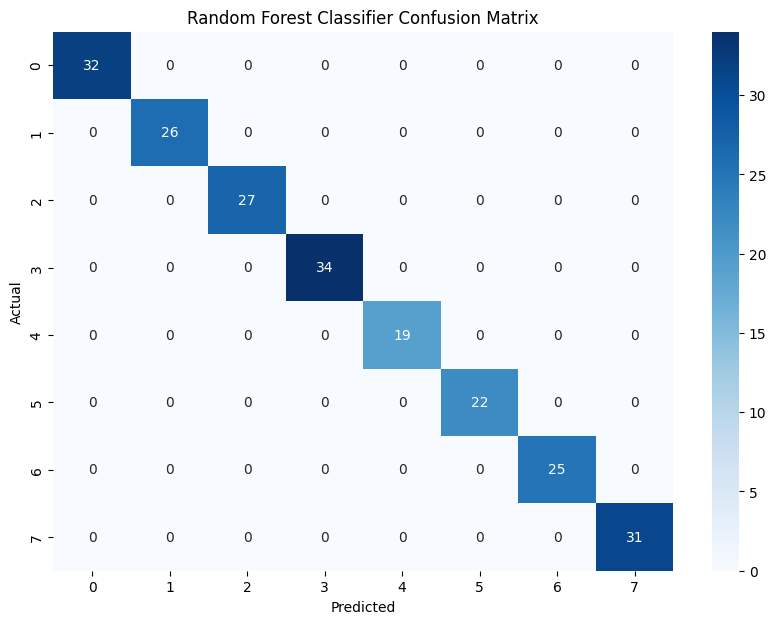

In [38]:
print("Random Forest Model Evaluation")
evaluate_model(best_rf, X_test, y_test, "Random Forest Classifier")

**Evaluating SVM**

SVM Model Evaluation

SVM Evaluation:
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        32
           1       1.00      1.00      1.00        26
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        19
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        31

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



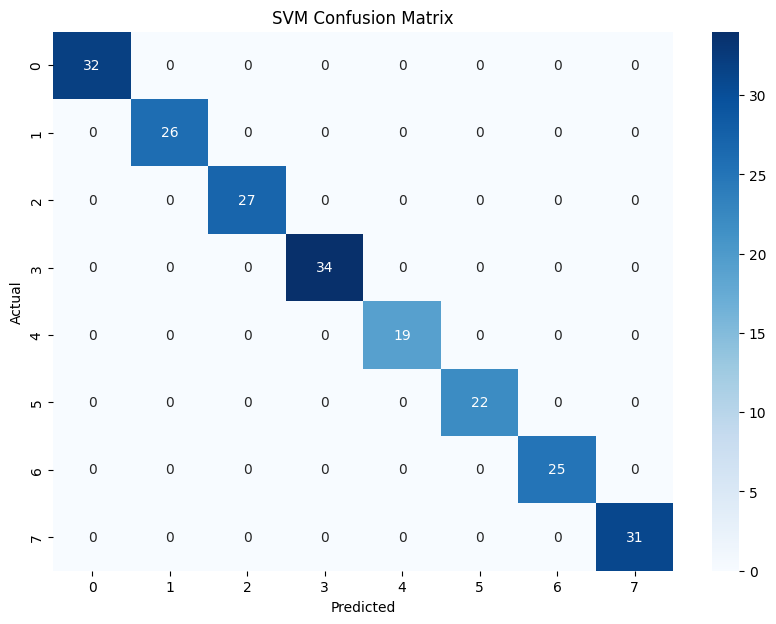

In [39]:
print("SVM Model Evaluation")
evaluate_model(best_svm, X_test, y_test, "SVM")

**Evaluating XGBoost**

XGBoost Model Evaluation

XGBoost Evaluation:
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        32
           1       1.00      1.00      1.00        26
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        19
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        31

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



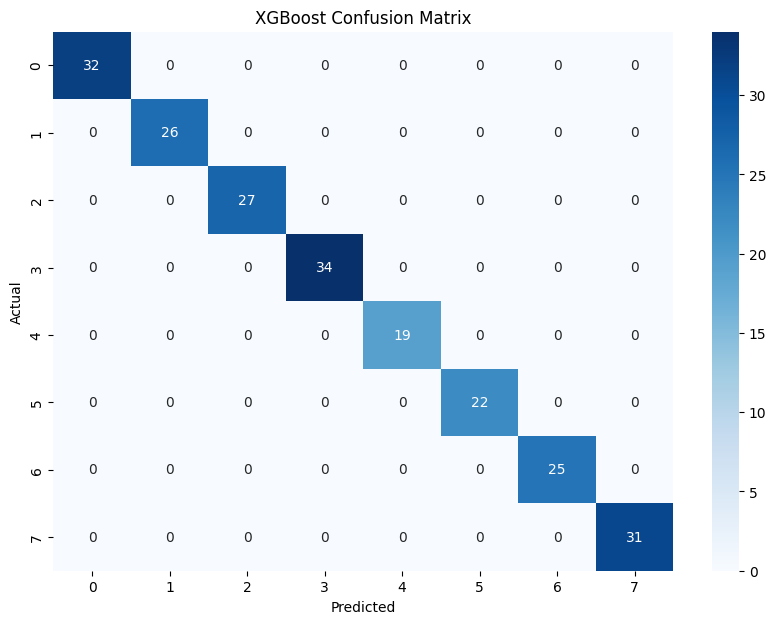

In [40]:
print("XGBoost Model Evaluation")
evaluate_model(best_xgb, X_test, y_test, "XGBoost")

# Interpretation

**Summarizing Model Performance**

In [41]:
def collect_metrics(model, X_test, y_test):
    y_pred = model.predict(X_test)
    metrics = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'Recall': recall_score(y_test, y_pred, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred, average='weighted')
    }
    return metrics

In [42]:
# Collect metrics for each model
rf_metrics = collect_metrics(best_rf, X_test, y_test)
svm_metrics = collect_metrics(best_svm, X_test, y_test)
xgb_metrics = collect_metrics(best_xgb, X_test, y_test)

metrics_df = pd.DataFrame({
    'Model': ['Random Forest', 'SVM', 'XGBoost'],
    'Accuracy': [rf_metrics['Accuracy'], svm_metrics['Accuracy'], xgb_metrics['Accuracy']],
    'Precision': [rf_metrics['Precision'], svm_metrics['Precision'], xgb_metrics['Precision']],
    'Recall': [rf_metrics['Recall'], svm_metrics['Recall'], xgb_metrics['Recall']],
    'F1 Score': [rf_metrics['F1 Score'], svm_metrics['F1 Score'], xgb_metrics['F1 Score']]
})

**Plot bar graphs for each metric**

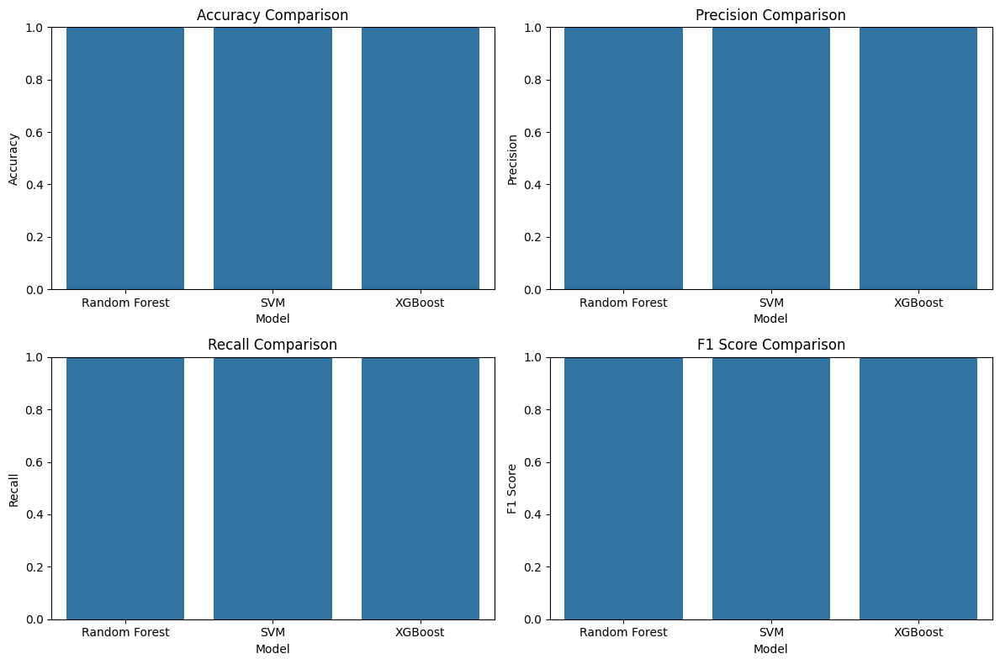

In [43]:
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
plt.figure(figsize=(12, 8))
for metric in metrics:
    plt.subplot(2, 2, metrics.index(metric) + 1)
    sns.barplot(x='Model', y=metric, data=metrics_df)
    plt.title(f'{metric} Comparison')
    plt.ylim(0, 1) 
plt.tight_layout()
plt.show()

**Analyze Feature Importance**

In [44]:
# Function for plotting feature importance bar graph
def plot_feature_importance(model, model_name):
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        feature_names = X_test.columns
        importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
        importance_df = importance_df.sort_values(by='Importance', ascending=False)
        plt.figure(figsize=(10, 8))
        sns.barplot(x='Importance', y='Feature', data=importance_df)
        plt.title(f'{model_name} Feature Importances')
        plt.show()
    else:
        print(f"{model_name} does not support feature importances.")

**Random forest feature importance**

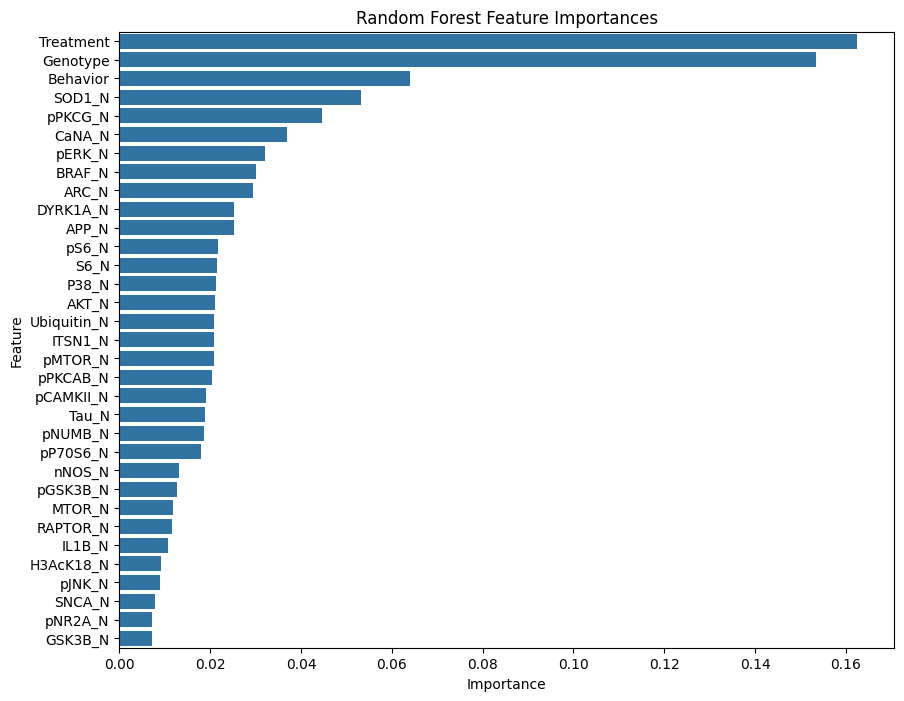

In [45]:
plot_feature_importance(best_rf, "Random Forest")

**XGBoost feature importance**

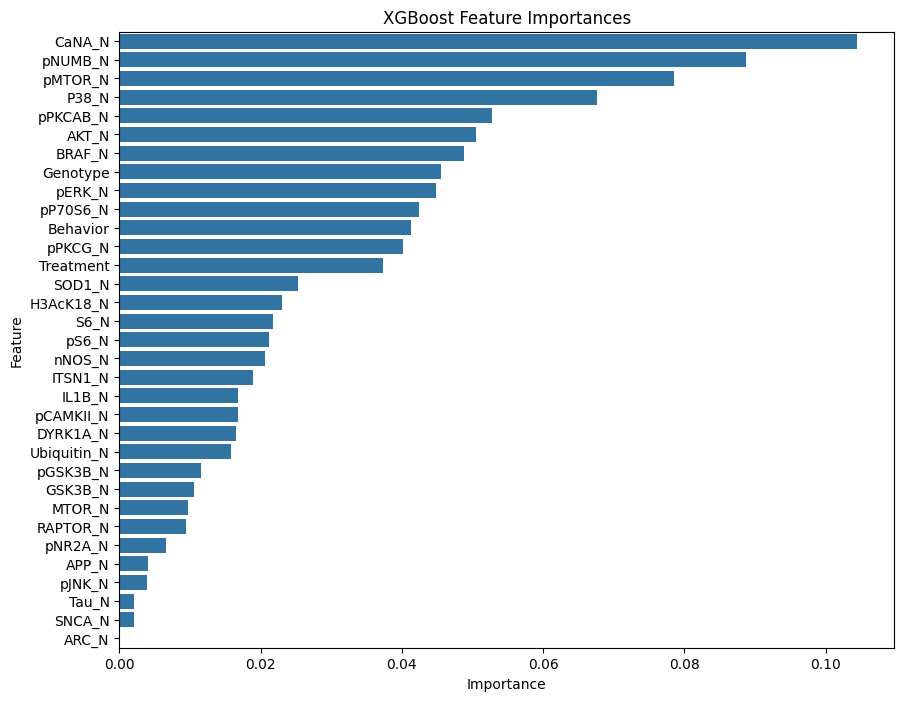

In [46]:
plot_feature_importance(best_xgb, "XGBoost")

**SVM feature importance**

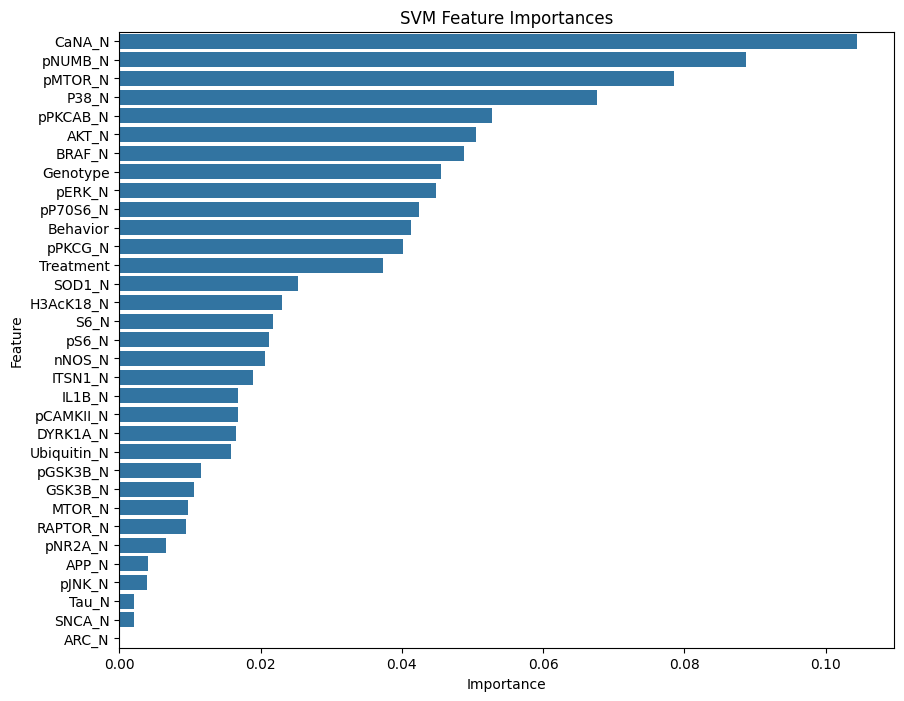

In [47]:
plot_feature_importance(best_xgb, "SVM")

**Hyperparameter Tuning Results**

In [48]:

def print_best_params(grid_search, model_name):
    print(f"\nBest Hyperparameters for {model_name}:")
    print(grid_search.best_params_)

print_best_params(rf_grid_search, "Random Forest")
print_best_params(svm_grid_search, "SVM")
print_best_params(xgb_grid_search, "XGBoost")


Best Hyperparameters for Random Forest:
{'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

Best Hyperparameters for SVM:
{'C': 0.1, 'gamma': 1, 'kernel': 'linear'}

Best Hyperparameters for XGBoost:
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.6}
